## p, q, b, d Ablation Study

1. Core Reason: They are complementary words
2. Work on a CNN which divides into these categories and see how the confidence score changes with ablations



More Ideas:

1. Insights into how the model works
2. Biases
3. Attention Mechanism



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### No Finetuned, ImageNet Trained ResNet with Ablation

1. We will see how the ResNet models perceive p, q
2. What happens to when we rotate them, what will be the impact on the confidence scores

We will do this for the rotated and the standard images

In [ ]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [ ]:
import os

In [ ]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class CustomImageDataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.image_files = [f for f in os.listdir(root) if os.path.isfile(os.path.join(root, f))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root, self.image_files[idx])
        image = Image.open(img_name).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image

# Usage:
dataset_p = CustomImageDataset(root="/content/drive/MyDrive/p_q_b_d_study/small_p", transform=transform)
dataset_q = CustomImageDataset(root="/content/drive/MyDrive/p_q_b_d_study/small_q", transform=transform)


loader_p = DataLoader(dataset_p, batch_size=1, shuffle=False)
loader_q = DataLoader(dataset_q, batch_size=1, shuffle=False)


In [ ]:
import torchvision.models as models
resnet18 = models.resnet18(pretrained=True).eval()  # Load the pretrained model in evaluation mode

In [ ]:
dataset_p

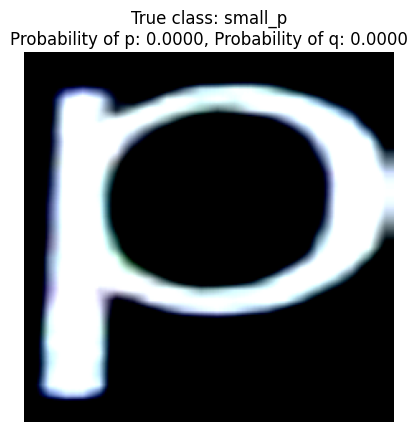

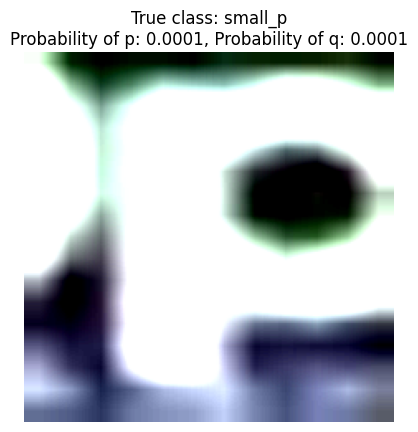

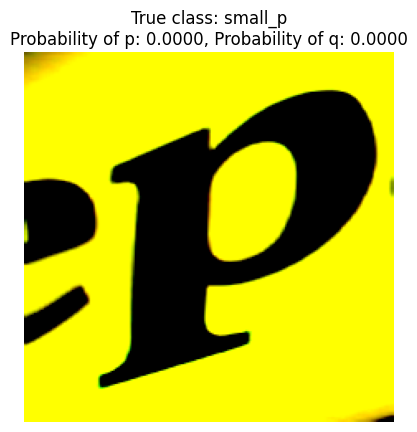

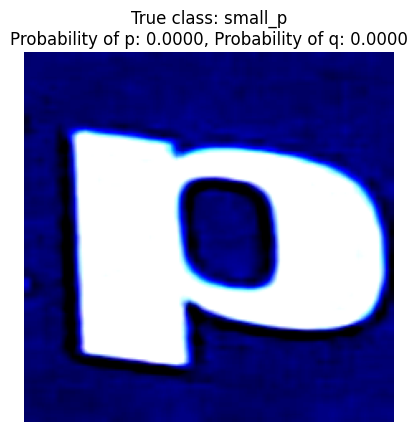

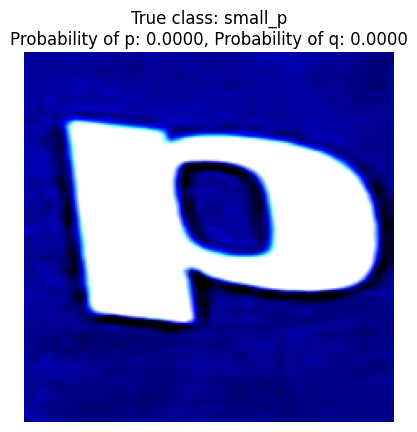

...

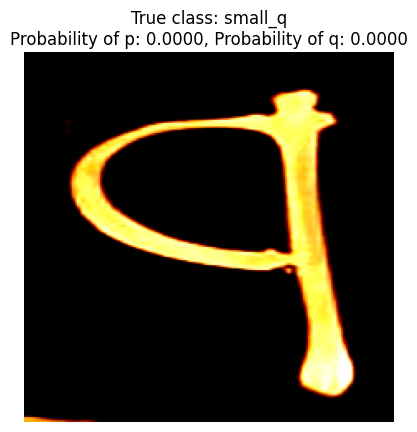

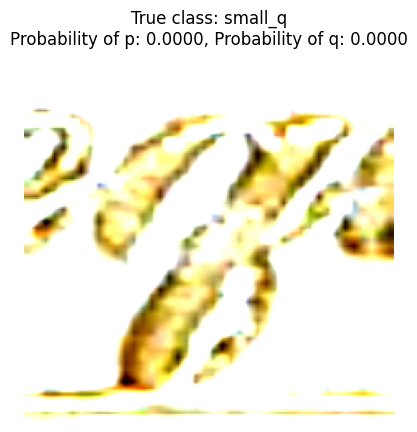

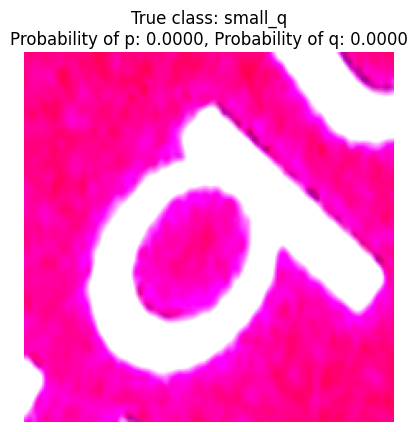

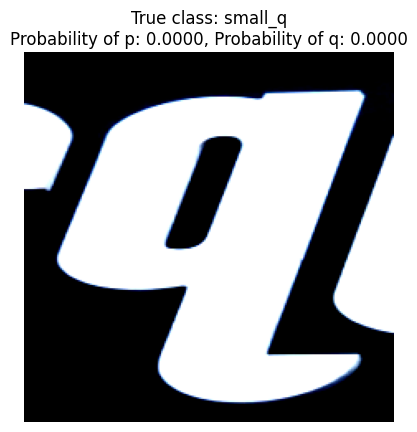

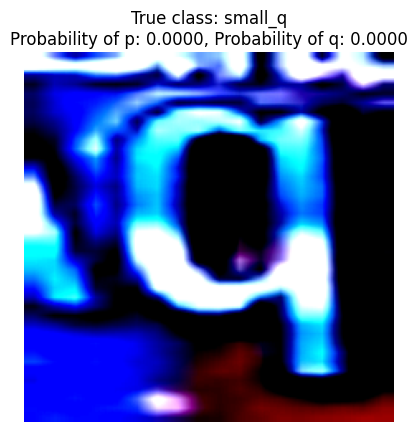

In [ ]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

def get_predictions_and_display(loader, class_name):
    for img_tensor in loader:
        # Ensure tensor is in the right shape
        if len(img_tensor.shape) == 3:
            img_tensor = img_tensor.unsqueeze(0)

        # Get model prediction
        output = resnet18(img_tensor)
        probabilities = F.softmax(output, dim=1)

        # Display image
        image = img_tensor[0].permute(1, 2, 0)
        plt.imshow(image)
        plt.axis('off')

        # Display the prediction
        prob_p = probabilities[0][0].item()
        prob_q = probabilities[0][1].item()

        title = f"True class: {class_name}\nProbability of p: {prob_p:.4f}, Probability of q: {prob_q:.4f}"
        plt.title(title)
        plt.show()

# Get predictions for images from both folders
get_predictions_and_display(loader_p, "small_p")
get_predictions_and_display(loader_q, "small_q")


In [ ]:
import torch
import torchvision.models as models

class ModifiedResNet18(torch.nn.Module):
    def __init__(self, original_model, i, j):
        super(ModifiedResNet18, self).__init__()
        self.features = torch.nn.Sequential(*list(original_model.children())[:-1])  # Everything except the last layer
        self.fc = list(original_model.children())[-1]  # Last layer
        self.i = i
        self.j = j

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        logits = self.fc(x)

        # Zero out all logits except for i and j
        mask = torch.zeros(logits.shape).to(logits.device)
        mask[:, self.i] = 1.0
        mask[:, self.j] = 1.0
        logits = logits * mask

        return logits

# Initialize the modified model
resnet18 = models.resnet18(pretrained=True)
modified_resnet18 = ModifiedResNet18(resnet18, i=555, j=777).eval()  # 'i' and 'j' are dummy indices


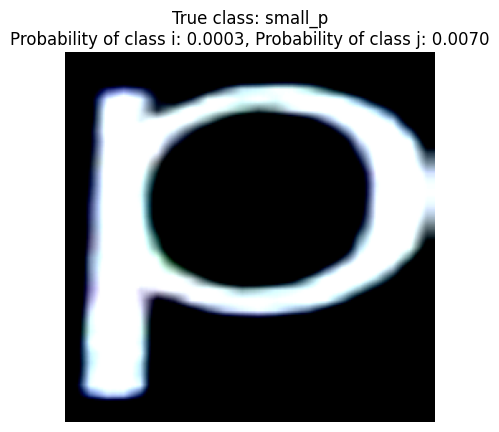

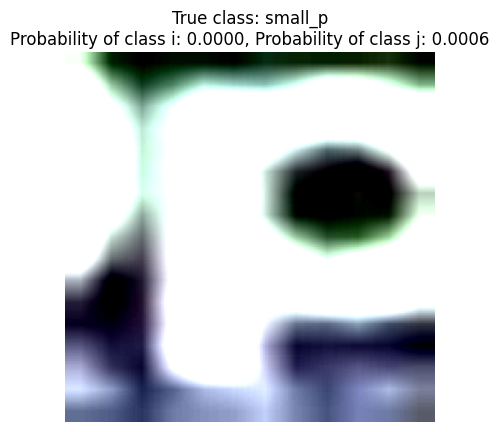

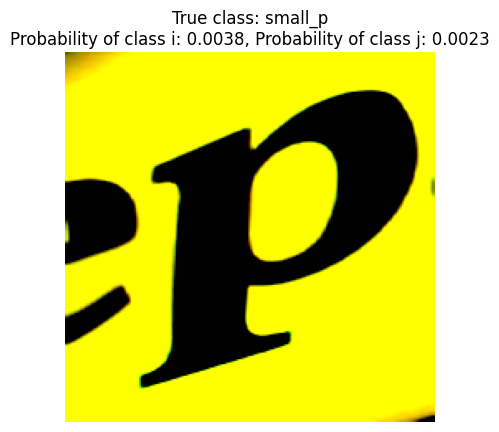

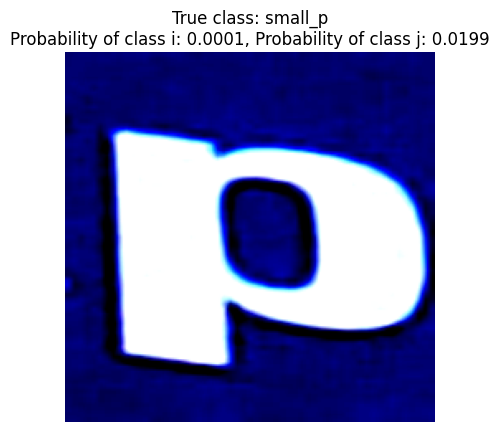

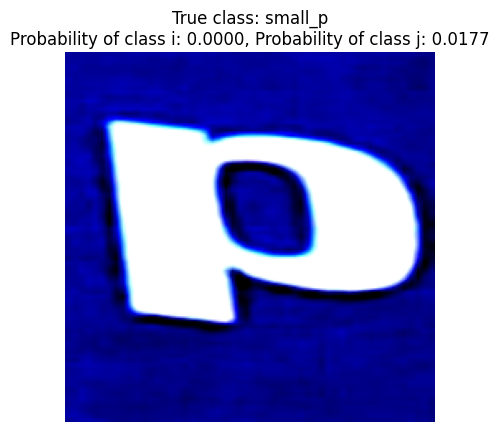

...

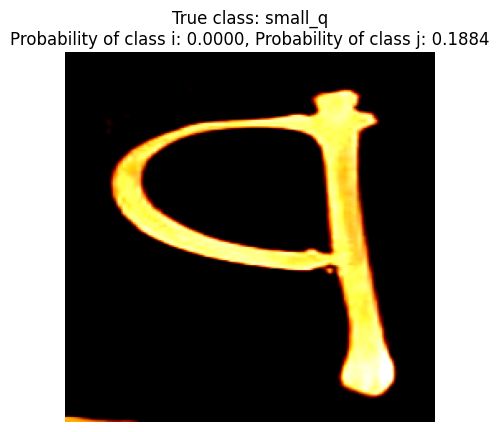

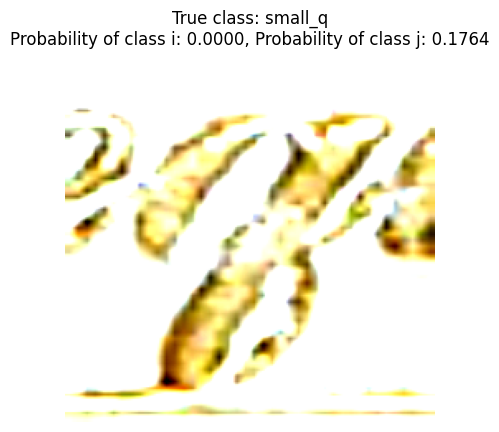

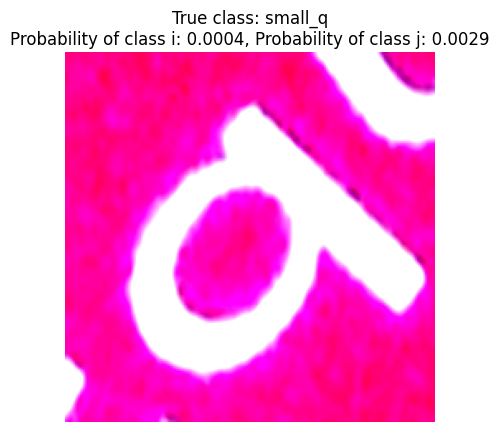

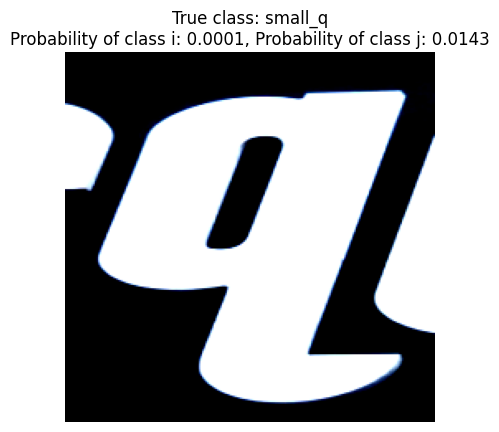

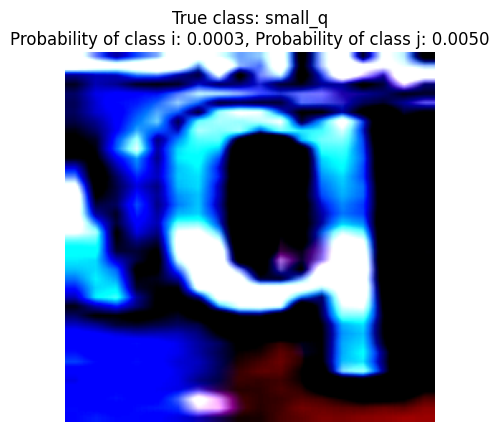

In [ ]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

def get_predictions_and_display(loader, class_name, model):
    for img_tensor in loader:
        # Ensure tensor is in the right shape
        if len(img_tensor.shape) == 3:
            img_tensor = img_tensor.unsqueeze(0)

        # Get model prediction
        output = model(img_tensor)
        probabilities = F.softmax(output, dim=1)

        # Display image
        image = img_tensor[0].permute(1, 2, 0).numpy()
        plt.imshow(image)
        plt.axis('off')

        # Display the prediction
        prob_i = probabilities[0][555].item()
        prob_j = probabilities[0][777].item()

        title = f"True class: {class_name}\nProbability of class i: {prob_i:.4f}, Probability of class j: {prob_j:.4f}"
        plt.title(title)
        plt.show()

# Get predictions for images from both folders
get_predictions_and_display(loader_p, "small_p", modified_resnet18)
get_predictions_and_display(loader_q, "small_q", modified_resnet18)


## Finetune Resnet on Alphabet Class then test with ablated images


In [ ]:
import torch
import torchvision
from torchvision import transforms
from torchvision.models import resnet18
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim

In [ ]:
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader

# Transforms: ToTensor only
transform = transforms.Compose([
    transforms.ToTensor()
])

# Load the EMNIST dataset - Letters only
train_dataset = datasets.EMNIST(root='./data', split='letters', train=True, transform=transform, download=True)
test_dataset = datasets.EMNIST(root='./data', split='letters', train=False, transform=transform, download=True)


In [ ]:
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

In [ ]:
# Modify ResNet
model = resnet18(pretrained=True)
model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)  # Modify for grayscale
model.fc = nn.Linear(model.fc.in_features, 26)  # Modify for 26 classes

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Fine-Tuning
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    print(epoch)
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        labels -= 1  # Adjust the labels to be in range 0-25 (since EMNIST Letters labels are 1-26)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

# Save the fine-tuned model
torch.save(model.state_dict(), 'resnet18_emnist_letters_Letters.pth')

0
1
2
3
4
5
6
7
8
9


In [ ]:
def evaluate_model_per_class(model, dataloader, device, num_classes):
    class_correct = [0.0] * num_classes
    class_total = [0.0] * num_classes
    class_accuracy = [0.0] * num_classes

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            c = (predicted == labels).squeeze()
            for i in range(labels.size(0)):
                label = labels[i] - 1  # Adjusting for 0-based indexing
                class_correct[label] += c[i].item()
                class_total[label] += 1

    for i in range(num_classes):
        if class_total[i] > 0:
            class_accuracy[i] = 100 * class_correct[i] / class_total[i]
        else:
            class_accuracy[i] = 0

    return class_accuracy

num_classes = 26
class_names = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']

class_accuracies = evaluate_model_per_class(model, test_loader, device, num_classes)
for i, accuracy in enumerate(class_accuracies):
    print(f"Accuracy for class {class_names[i]}: {accuracy:.2f}%")


Accuracy for class a: 2.88%
Accuracy for class b: 4.62%
Accuracy for class c: 4.12%
Accuracy for class d: 1.88%
Accuracy for class e: 4.75%
Accuracy for class f: 4.62%
Accuracy for class g: 3.25%
Accuracy for class h: 3.12%
Accuracy for class i: 4.25%
Accuracy for class j: 2.50%
Accuracy for class k: 5.00%
Accuracy for class l: 3.25%
Accuracy for class m: 6.00%
Accuracy for class n: 1.75%
Accuracy for class o: 2.62%
Accuracy for class p: 4.62%
Accuracy for class q: 3.38%
Accuracy for class r: 3.00%
Accuracy for class s: 2.62%
Accuracy for class t: 2.50%
Accuracy for class u: 4.50%
Accuracy for class v: 1.00%
Accuracy for class w: 3.25%
Accuracy for class x: 8.38%
Accuracy for class y: 2.38%
Accuracy for class z: 0.00%


In [ ]:

image_folder = "/content/drive/MyDrive/p_q_b_d_study/small_q_p_images"
desired_images = ['q_4_0.png', 'q_4_90.png', 'q_4_180.png']
image_paths = [os.path.join(image_folder, img_name) for img_name in desired_images if os.path.exists(os.path.join(image_folder, img_name))]


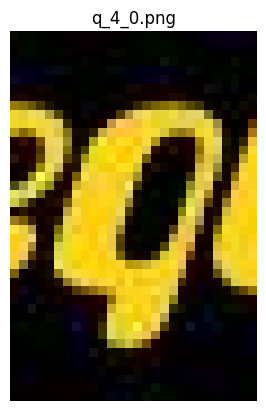

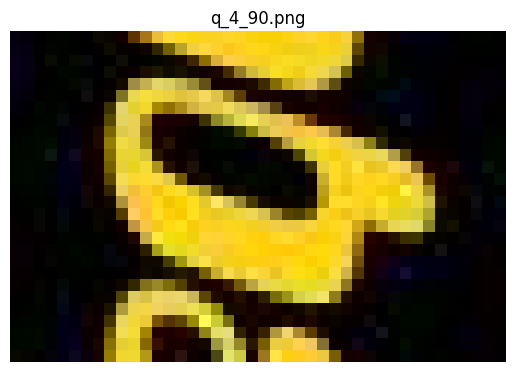

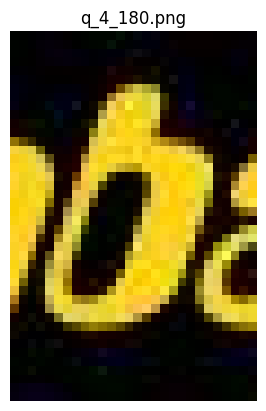

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

for path in image_paths:
    img = Image.open(path).convert("RGB")
    plt.imshow(img)
    plt.title(os.path.basename(path))
    plt.axis('off')
    plt.show()

In [ ]:
def get_image_prediction(model, image_tensor):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.unsqueeze(0).to(device)
        outputs = model(image_tensor)
        probs = nn.Softmax(dim=1)(outputs)
        p_score, q_score = probs[0][16].item(), probs[0][17].item()  # Adjusted indices for 'p' and 'q'
    return p_score, q_score

transform = transforms.Compose([transforms.Grayscale(num_output_channels=1), transforms.Resize((224, 224)), transforms.ToTensor()])
tensor_images = [transform(Image.open(path).convert('RGB')) for path in image_paths]


In [ ]:
for image_tensor, path in zip(tensor_images, image_paths):
    p_score, q_score = get_image_prediction(model_resnet18_pretrained_all_letter_finetune, image_tensor)
    print(f"Image: {os.path.basename(path)}, p: {p_score:.4f}, q: {q_score:.4f}")

Image: q_4_0.png, p: 0.4701, q: 0.0000
Image: q_4_90.png, p: 0.0657, q: 0.0000
Image: q_4_180.png, p: 0.3635, q: 0.0000
